# Cluster Annotation

In [1]:
here::i_am("rna_atac/clustering/02_clustering.ipynb")

source(here::here("settings.R"))
source(here::here("utils.R"))

suppressPackageStartupMessages(library(scran))
suppressPackageStartupMessages(library(scater))
suppressPackageStartupMessages(library(Seurat))
suppressPackageStartupMessages(library(dplyr))
suppressPackageStartupMessages(library(ArchR))

BPPARAM <- BiocParallel::bpparam()
BPPARAM$workers = 21

# Multi core using future - built in to seurat
plan("multicore", workers = 16)
options(future.globals.maxSize = 50 * 1024 ^ 3) # for 50 Gb RAM

here() starts at /rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/code

Warning message:
“package ‘rtracklayer’ was built under R version 4.2.3”

                                                   / |
                                                 /    \
            .                                  /      |.
            \\\                              /        |.
              \\\                          /           `|.
                \\\                      /              |.
                  \                    /                |\
                  \\#####\           /                  ||
                ==###########>      /                   ||
                 \\##==......\    /                     ||
            ______ =       =|__ /__                     ||      \\\
        ,--' ,----`-,__ ___/'  --,-`-===================##========>
       \               '        ##_______ _____ ,--,__,=##,__   ///
        ,    __==    ___,-,__,--'#'  ==='      `-'    | 

In [3]:
args = list()
# UMAP
args$MOFA_umap = file.path(io$basedir, 'results/rna_atac/dimensionality_reduction/mofa/MOFA_umap.txt.gz')

# RNA_sce
args$rna_sce = file.path(io$basedir, 'processed/rna/SingleCellExperiment.rds')

# Archr
args$archr_directory = file.path(io$basedir, 'processed/atac/archR')

# outdir
args$outdir = file.path(io$basedir, 'results/rna_atac/clustering/')

# Metadata
args$metadata = file.path(args$outdir, 'metadata_mofa_clusters.txt.gz')

# Mapping metadata
args$mapping = file.path(io$basedir, 'results/rna/mapping/sample_metadata_after_mapping.txt.gz')

In [419]:
# Load meta
meta = fread(args$metadata)

# Load mofa 
umap = fread(args$MOFA_umap)

## RNA

In [4]:
# load sce
rna.sce <- load_SingleCellExperiment(args$rna_sce, normalise = TRUE, cells = meta$cell)
colData(rna.sce) = meta %>% as.data.frame() %>% tibble::column_to_rownames('cell') %>% DataFrame()

# Convert to Seurat
seurat = as.Seurat(rna.sce)

In [5]:
# Prepare mofa umap
umap.mtx = umap[match(meta$cell, cell)] %>% 
    as.data.frame(.) %>% 
    tibble::column_to_rownames('cell') %>%
    as.matrix()
seurat[["umap"]] <- CreateDimReducObject(embeddings = umap.mtx, key = "umap_", assay = DefaultAssay(seurat))

In [6]:
Idents(seurat) = seurat@meta.data$mofa_cluster

#### Seurat

In [50]:
# Marker detection
markers <- FindAllMarkers(seurat, 
                          only.pos = TRUE, 
                          min.pct = 0.5,
                          logfc.threshold = 0.5, 
                          verbose = F)

In [51]:
library(dplyr)
markers_top = markers %>%
    group_by(cluster) %>%
    slice_max(n = 15, order_by = avg_log2FC)

fwrite(markers_top, sprintf('%s/markers_RNA_top.txt.gz', args$outdir))
fwrite(markers, sprintf('%s/markers_RNA.txt.gz', args$outdir))

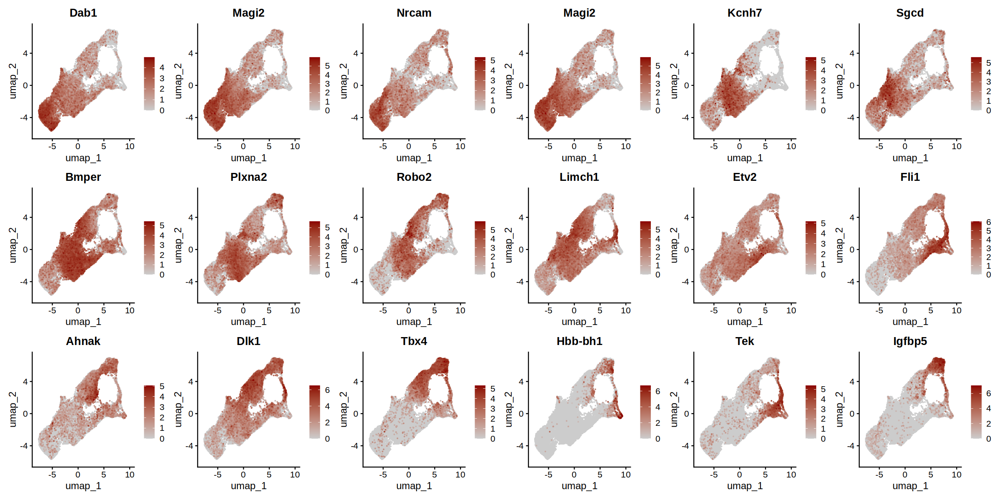

In [52]:
features = markers %>%
    group_by(cluster) %>%
    slice_max(n = 1, order_by = avg_log2FC) %>% .$gene

options(repr.plot.width=20, repr.plot.height=10)
FeaturePlot(seurat, 
            features = features, 
            cols = c('grey80', 'darkred'),
            ncol = 6,
            order = T)

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


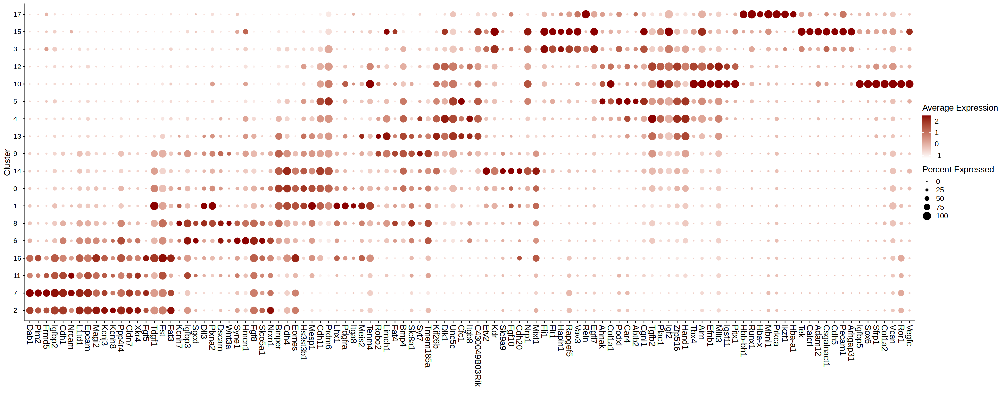

In [53]:
features = markers %>%
    group_by(cluster) %>%
    slice_max(n = 8, order_by = avg_log2FC) %>% .$gene

cluster_levels = c(2, 7, 11, 16,
                  6, 8, 
                  1, 0,  14,
                  9, 13, 
                  4, 5, 10, 12,
                  3, 15,
                  17)
seurat@meta.data$mofa_cluster = factor(seurat@meta.data$mofa_cluster, levels = cluster_levels)

options(repr.plot.width=25, repr.plot.height=10)
DotPlot(seurat, features = unique(features), group.by = 'mofa_cluster') + 
    scale_color_gradient(low='white', high='darkred', name='Average Expression') + 
    RotatedAxis() +
    ylab('Cluster') + xlab('') +
    theme(text=element_text(size=15), 
                         axis.text.x=element_text(angle=-90,hjust=0,vjust=0.5, size=15), 
                         axis.text.y=element_text(hjust=0))

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


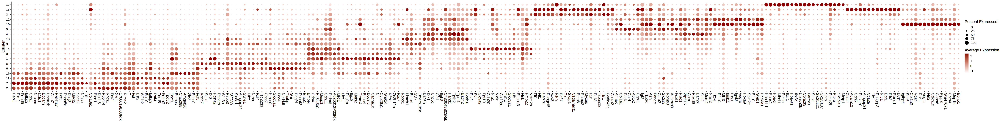

In [55]:
features = markers %>%
    group_by(cluster) %>%
    slice_max(n = 20, order_by = avg_log2FC) %>% .$gene

options(repr.plot.width=55, repr.plot.height=7)
DotPlot(seurat, features = unique(features), group.by = 'mofa_cluster') + 
    scale_color_gradient(low='white', high='darkred', name='Average Expression') + 
    RotatedAxis() +
    ylab('Cluster') + xlab('') +
    theme(text=element_text(size=15), 
                         axis.text.x=element_text(angle=-90,hjust=0,vjust=0.5, size=15), 
                         axis.text.y=element_text(hjust=0))

#### EdgeR

In [67]:
suppressPackageStartupMessages(library(edgeR))

In [60]:
all_genes = rownames(rna.sce)
non_informative = all_genes[grep("*Rik|^Gm|^Rps|^Rpl|^Olfr", all_genes)] # Mt genes kept for this analysis
rna.sce = rna.sce[!rownames(rna.sce) %in% non_informative,]
rna.sce

class: SingleCellExperiment 
dim: 19979 31596 
metadata(0):
assays(2): counts logcounts
rownames(19979): Xkr4 Rp1 ... AC234645.1 AC149090.1
rowData names(0):
colnames(31596): 1A_Eo_DEG_G9_day3#AAACAGCCAGCAAGAT-1
  1A_Eo_DEG_G9_day3#AAACAGCCAGCACCAT-1 ...
  rv_eo_deg_day4_dtag#TTTGTGTTCATTTGTC-1
  rv_eo_deg_day4_dtag#TTTGTTGGTACTTAGG-1
colData names(26): barcode sample ... exp mofa_cluster
reducedDimNames(0):
mainExpName: RNA
altExpNames(0):

In [ ]:
###################
## Find DEGs using EdgeR --> Run overnight!
###################
DEGs = mclapply(unique(meta$mofa_cluster), function(ct, min_cells = 25, min.expr = 1, min.perc = 0.3){ # unique(meta$mofa_cluster)
    # min_cells = minimum number of cell to perform testing
    # min.expr = minimum mean expression level in either condition
    # min.perc = minimum proportion of cells expressing the gene in either condition
        args$groupA = ct
        args$groupB = setdiff(unique(meta$mofa_cluster),ct)
    if (nrow(meta[mofa_cluster == args$groupA]) < min_cells | nrow(meta[mofa_cluster %in% args$groupB]) < min_cells) {
      cat(paste0(ct, ' skipped'))
      out <- data.table(gene=NA, logFC=NA, padj_fdr=NA, mean_groupA=NA, mean_groupB=NA)
      #fwrite(out, args$outfile, sep="\t", na="NA", quote=F)
    } else {
        cat(ct)
        #########################################
        ## Calculate average expression levels ##
        #########################################

        expr.dt <- data.table(
          gene = rownames(rna.sce),
          mean_groupA = rowMeans(logcounts(rna.sce[,meta$mofa_cluster==args$groupA])) %>% round(2),
          mean_groupB = rowMeans(logcounts(rna.sce[,meta$mofa_cluster%in%args$groupB])) %>% round(2),
          perc_groupA = rowMeans(logcounts(rna.sce[,meta$mofa_cluster==args$groupA])>0) %>% round(2),
          perc_groupB = rowMeans(logcounts(rna.sce[,meta$mofa_cluster%in%args$groupB])>0) %>% round(2)
        )

        #######################
        ## Feature selection ##
        #######################

        # 2**4 = 16, at least an average of 8 counts per milion for each group

        genes.to.use <- expr.dt[mean_groupA>=min.expr | mean_groupB>=min.expr,][perc_groupA>=min.perc | perc_groupB>=min.perc,gene]

        ################################################
        ## Differential expression testing with edgeR ##
        ################################################

        # Convert SCE to DGEList
        sce_edger <- scran::convertTo(rna.sce[genes.to.use,], type="edgeR")
        sce_edger$design = ifelse(meta$mofa_cluster==ct, 'group', 'bg')

        # Calculate Normalisation Factors
        sce_edger <- calcNormFactors(sce_edger)
        
        # Define design matrix (with intercept)
        design <- model.matrix(~sce_edger$design)

        # Estimate dispersions
        sce_edger  <- estimateDisp(sce_edger,design)

        # Fit GLM
        fit <- glmQLFit(sce_edger,design)

        # Likelihood ratio test
        lrt <- glmQLFTest(fit)

        # Construct output data.frame
        out <- topTags(lrt, n=nrow(lrt))$table %>% as.data.table(keep.rownames=T) %>%
          setnames(c("gene","logFC","logCPM","LR","p.value","padj_fdr")) %>%
          .[,c("logCPM","LR","p.value"):=NULL] %>%
          .[,c("padj_fdr","logFC"):=list(signif(padj_fdr,digits=3), round(logFC,3))] %>%
          merge(expr.dt, by="gene", all.y=TRUE) %>%
          setorder(padj_fdr, na.last=T)
    }
    out = out %>% .[,mofa_cluster:=ct]
    return(out)
}, mc.cores=1) %>% rbindlist(.)

In [ ]:
fwrite(DEGs, sprintf('%s/markers_RNA_edgeR.txt.gz', args$outdir))

In [7]:
DEGs = fread(sprintf('%s/markers_RNA_edgeR.txt.gz', args$outdir))

In [11]:
# Check if all clusters present
unique(DEGs$mofa_cluster)[order(unique(DEGs$mofa_cluster))]

[1]  0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17

In [15]:
head(DEGs)

gene,logFC,padj_fdr,mean_groupA,mean_groupB,perc_groupA,perc_groupB,mofa_cluster
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>
Airn,-3.109,0,0.42,1.53,0.31,0.56,7
Alg13,1.386,0,2.38,1.18,0.95,0.69,7
Amot,-3.242,0,0.94,3.42,0.59,0.95,7
Bambi,-2.824,0,0.16,1.14,0.15,0.61,7
Bex4,1.355,0,1.74,0.78,0.88,0.53,7
Bicd1,1.849,0,1.34,0.37,0.74,0.26,7


In [16]:
DEGs = DEGs[,sig:=ifelse(abs(logFC) > 1 & padj_fdr<0.05, TRUE, FALSE)]

In [19]:
# Plotting function
gg_volcano_plot <- function(mofa_cluster_i=1, top_genes=20, xlim=5, ylim=40, label_groups = NULL) {
  to.plot = DEGs[mofa_cluster == mofa_cluster_i]
  negative_hits <- to.plot[sig==TRUE & logFC<0,gene]
  positive_hits <- to.plot[sig==TRUE & logFC>0,gene]
  all <- nrow(to.plot[!is.na(sig)])
  to.plot = to.plot[,logFC_plot:=ifelse(logFC<=-xlim, -xlim, ifelse(logFC>=xlim, xlim, logFC))] %>%
               .[,log10_padj_fdr:=ifelse(-log10(padj_fdr)>=ylim, ylim, -log10(padj_fdr))]
  
  # if (is.null(xlim))
  #   xlim <- max(abs(to.plot$logFC), na.rm=T)
  # if (is.null(ylim))
  #   ylim <- max(-log10(to.plot$padj_fdr+1e-100), na.rm=T)
  
  to.plot <- to.plot[!is.na(logFC) & !is.na(padj_fdr)] %>% .[order(-abs(logFC))]
  label_genes = c(head(to.plot[sig==T & logFC<=0, gene],n=top_genes), head(to.plot[sig==T & logFC>=0, gene],n=top_genes))
  
  p <- ggplot(to.plot, aes(x=logFC_plot, y=log10_padj_fdr)) +
        labs(x="Log fold change", y=expression(paste("-log"[10],"(q.value)"))) +
        ggrastr::geom_point_rast(aes(color=sig, size=sig)) +
        # geom_hline(yintercept = -log10(opts$threshold_fdr), color="blue") +
        geom_segment(aes(x=0, xend=0, y=0, yend=ylim*1.05), color="orange", size=0.5) +
        scale_color_manual(values=c("black","red")) +
        scale_size_manual(values=c(0.5,1)) +
        scale_x_continuous(limits=c(-xlim,xlim)) +
        scale_y_continuous(limits=c(0,ylim*1.16)) +
        annotate("text", x=0, y=ylim*1.1, size=6, label=sprintf("(%d)", all)) +
        annotate("text", x=-xlim*0.9, y=ylim*1.15, size=6, label=sprintf("%d (-)",length(negative_hits))) +
        annotate("text", x=xlim*0.9, y=ylim*1.15, size=6, label=sprintf("%d (+)",length(positive_hits))) +
        ggrepel::geom_text_repel(data=to.plot[gene %in% label_genes],
                                        aes(x=logFC_plot, y=log10_padj_fdr, label=gene), 
                                         max.overlaps=Inf, 
                                         box.padding = 0.5,
                                         bg.color='white', 
                                         bg.r = 0.1,
                                         size=5) +
        theme_classic() +
        theme(
           axis.text = element_text(color='black'),
          # axis.title = element_text(size=rel(1.0), color='black'),
          text=element_text(size=15),
          legend.position="none"
        ) + 
        ggtitle(mofa_cluster_i)
    
    
  if (length(label_groups)>0) {
    p <- p +
      annotate("text", x=-4, y=0, size=4, label=sprintf("Up in %s",label_groups[2])) +
      annotate("text", x=4, y=0, size=4, label=sprintf("Up in %s",label_groups[1]))
  }
  
  return(p)
}

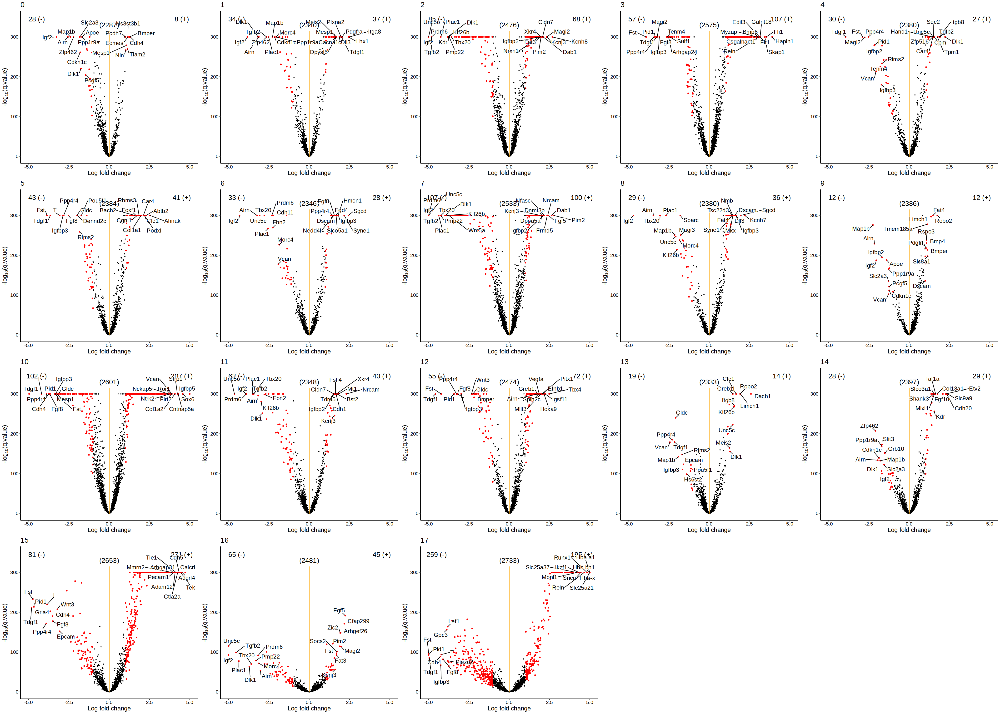

In [29]:
# Plot
plots = mclapply(0:17, gg_volcano_plot, top_genes=10, ylim=300, xlim=5, mc.cores=17)

options(repr.plot.width=35, repr.plot.height=25)
ggarrange(plotlist=plots)

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


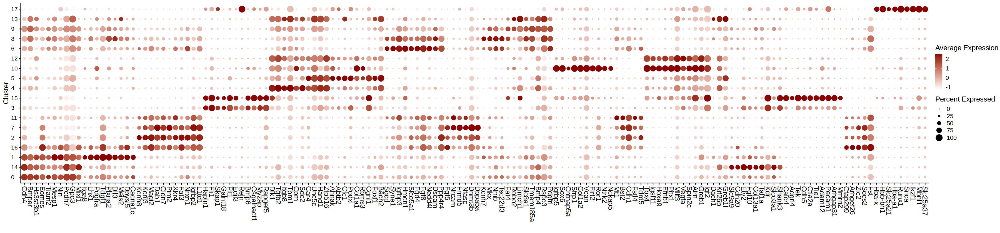

In [35]:
features = DEGs %>%
    group_by(mofa_cluster) %>%
    slice_max(n = 10, order_by = logFC) %>% .$gene

cluster_levels = c(
                  0,  14, 1,
                  16, 2, 7, 11,
                  3, 15,
                  4, 5, 10, 12,
                  6, 8, 
                  9, 13, 
                  17)
seurat@meta.data$mofa_cluster = factor(seurat@meta.data$mofa_cluster, levels = cluster_levels)

options(repr.plot.width=30, repr.plot.height=7)
DotPlot(seurat, features = unique(features), group.by = 'mofa_cluster') + 
    scale_color_gradient(low='white', high='darkred', name='Average Expression') + 
    RotatedAxis() +
    ylab('Cluster') + xlab('') +
    theme(text=element_text(size=15), 
                         axis.text.x=element_text(angle=-90,hjust=0,vjust=0.5, size=15), 
                         axis.text.y=element_text(hjust=0))

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


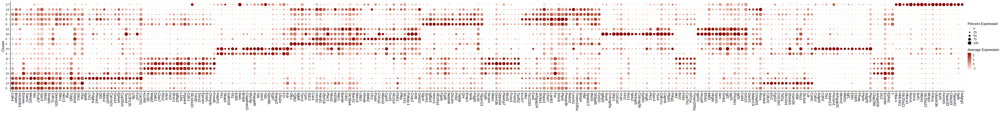

In [340]:
features = DEGs %>%
    group_by(mofa_cluster) %>%
    slice_max(n = 20, order_by = logFC) %>% .$gene

seurat@meta.data$mofa_cluster = factor(seurat@meta.data$mofa_cluster, levels = cluster_levels)

options(repr.plot.width=60, repr.plot.height=7)
DotPlot(seurat, features = unique(features), group.by = 'mofa_cluster') + 
    scale_color_gradient(low='white', high='darkred', name='Average Expression') + 
    RotatedAxis() +
    ylab('Cluster') + xlab('') +
    theme(text=element_text(size=15), 
                         axis.text.x=element_text(angle=-90,hjust=0,vjust=0.5, size=15), 
                         axis.text.y=element_text(hjust=0))

## ATAC

In [41]:
args$archr_directory = file.path(io$basedir, 'processed/atac/archR')
ArchRProject <- loadArchRProject(args$archr_directory)[meta$cell]
ArchRProject = ArchRProject[meta$cell]

Successfully loaded ArchRProject!


                                                   / |
                                                 /    \
            .                                  /      |.
            \\\                              /        |.
              \\\                          /           `|.
                \\\                      /              |.
                  \                    /                |\
                  \\#####\           /                  ||
                ==###########>      /                   ||
                 \\##==......\    /                     ||
            ______ =       =|__ /__                     ||      \\\
        ,--' ,----`-,__ ___/'  --,-`-===================##========>
       \               '        ##_______ _____ ,--,__,=##,__   ///
        ,    __==    ___,-,__,--'#'  ==='      `-'    | ##,-/
        -,____,---'       \\####\\________________,--\\_##,/
           ___      .______        ______  __    __  .____

In [391]:
addArchRThreads(22)

Setting default number of Parallel threads to 22.



In [44]:
ArchRProject <- addCellColData(ArchRProj = ArchRProject, 
                                    data = as.numeric(meta$mofa_cluster),
                                    cells = meta$cell,
                                    name = "mofa_cluster",
                                    force=TRUE)

In [43]:
getAvailableMatrices(ArchRProject)

[1] "DeviationMatrix_CISBP"  "DeviationMatrix_JASPAR" "GeneScoreMatrix_TSS"   
[4] "GeneScoreMatrix_distal" "MarkerPeaksMatrix"      "PeakMatrix"            
[7] "PeakMatrix_atlas"       "TileMatrix"

In [49]:
MotifMatrix = getMatrixFromProject(
  ArchRProj = ArchRProject,
  useMatrix = "DeviationMatrix_CISBP")

ArchR logging to : ArchRLogs/ArchR-getMatrixFromProject-15154a21b0b20c-Date-2023-05-25_Time-12-33-26.log
If there is an issue, please report to github with logFile!

2023-05-25 12:33:42 : Organizing colData, 0.266 mins elapsed.

2023-05-25 12:33:43 : Organizing rowData, 0.278 mins elapsed.

2023-05-25 12:33:43 : Organizing rowRanges, 0.278 mins elapsed.

2023-05-25 12:33:43 : Organizing Assays (1 of 2), 0.278 mins elapsed.

2023-05-25 12:33:44 : Organizing Assays (2 of 2), 0.305 mins elapsed.

2023-05-25 12:33:47 : Constructing SummarizedExperiment, 0.355 mins elapsed.

2023-05-25 12:33:48 : Finished Matrix Creation, 0.371 mins elapsed.



##### JASPAR

In [53]:
# Differential ChromVAR one v all
diffMotif <- getMarkerFeatures(
    ArchRProj = ArchRProject, 
    testMethod = "wilcoxon",
    binarize = FALSE,
    useMatrix = "DeviationMatrix_JASPAR",
    groupBy = "mofa_cluster",
    useSeqnames="z",
    verbose = F
)

ArchR logging to : ArchRLogs/ArchR-getMarkerFeatures-15154a391aadfb-Date-2023-05-25_Time-12-34-20.log
If there is an issue, please report to github with logFile!

MatrixClass = Sparse.Assays.Matrix

Pairwise Test 0 : Seqnames z

Pairwise Test 1 : Seqnames z

Pairwise Test 2 : Seqnames z

Pairwise Test 3 : Seqnames z

Pairwise Test 4 : Seqnames z

Pairwise Test 5 : Seqnames z

Pairwise Test 6 : Seqnames z

Pairwise Test 7 : Seqnames z

Pairwise Test 8 : Seqnames z

Pairwise Test 9 : Seqnames z

Pairwise Test 10 : Seqnames z

Pairwise Test 11 : Seqnames z

Pairwise Test 12 : Seqnames z

Pairwise Test 13 : Seqnames z

Pairwise Test 14 : Seqnames z

Pairwise Test 15 : Seqnames z

Pairwise Test 16 : Seqnames z

Pairwise Test 17 : Seqnames z

ArchR logging successful to : ArchRLogs/ArchR-getMarkerFeatures-15154a391aadfb-Date-2023-05-25_Time-12-34-20.log



In [320]:
saveRDS(diffMotif, sprintf('%s/diff_chromVAR_JASPAR.rds', args$outdir))

In [370]:
diffMotif.dt = lapply(colnames(diffMotif), function(x){
    tmp = data.table(motif = str_split(rowData(diffMotif)$name, '_') %>% map_chr(1),
                                  FDR = assay(diffMotif[,x], 'FDR')[[1]],
                                  MeanDiff = assay(diffMotif[,x], 'MeanDiff')[[1]]) %>% 
                        .[order(-MeanDiff)] %>% 
                        .[,mofa_cluster := x]
    return(tmp)
}) %>% rbindlist()

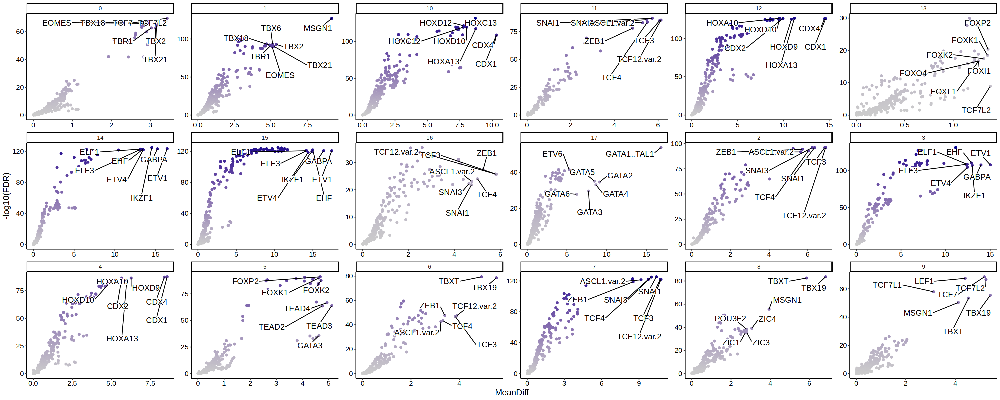

In [371]:
p = ggplot(diffMotif.dt[MeanDiff>0], aes(MeanDiff, -log10(FDR), label=motif)) +
            geom_point(aes(col = -log10(FDR))) +
            scale_color_gradient(low='gray80', high='darkblue', name = '-log10(FDR)') + 
            ggrepel::geom_text_repel(data=diffMotif.dt[MeanDiff>0] %>% 
                                            .[,head(.SD, 7), by=mofa_cluster],
                                aes(x=MeanDiff, y=-log10(FDR)), 
                                 max.overlaps=Inf, 
                                 box.padding = 0.8,
                                 bg.color='white', 
                                 bg.r = 0.1,
                                 size=5) +
    facet_wrap(~mofa_cluster, scales='free', ncol=6) + 
    theme_classic() +
    theme(
       axis.text = element_text(color='black'),
      # axis.title = element_text(size=rel(1.0), color='black'),
        strip.text = element_text(size=10),
      text=element_text(size=15),
      legend.position="none"
    ) 
options(repr.plot.width=25, repr.plot.height=10)
p

##### CISBP

In [373]:
# Differential ChromVAR one v all
diffMotif <- getMarkerFeatures(
    ArchRProj = ArchRProject, 
    testMethod = "wilcoxon",
    binarize = FALSE,
    useMatrix = "DeviationMatrix_CISBP",
    groupBy = "mofa_cluster",
    useSeqnames="z",
    verbose = F
)

ArchR logging to : ArchRLogs/ArchR-getMarkerFeatures-15154a910452c-Date-2023-05-25_Time-15-07-23.log
If there is an issue, please report to github with logFile!

MatrixClass = Sparse.Assays.Matrix

Pairwise Test 0 : Seqnames z

Pairwise Test 1 : Seqnames z

Pairwise Test 2 : Seqnames z

Pairwise Test 3 : Seqnames z

Pairwise Test 4 : Seqnames z

Pairwise Test 5 : Seqnames z

Pairwise Test 6 : Seqnames z

Pairwise Test 7 : Seqnames z

Pairwise Test 8 : Seqnames z

Pairwise Test 9 : Seqnames z

Pairwise Test 10 : Seqnames z

Pairwise Test 11 : Seqnames z

Pairwise Test 12 : Seqnames z

Pairwise Test 13 : Seqnames z

Pairwise Test 14 : Seqnames z

Pairwise Test 15 : Seqnames z

Pairwise Test 16 : Seqnames z

Pairwise Test 17 : Seqnames z

ArchR logging successful to : ArchRLogs/ArchR-getMarkerFeatures-15154a910452c-Date-2023-05-25_Time-15-07-23.log



In [495]:
diffMotif

class: SummarizedExperiment 
dim: 884 18 
metadata(2): MatchInfo Params
assays(6): Mean FDR ... AUC MeanBGD
rownames(884): 1 2 ... 883 884
rowData names(3): seqnames idx name
colnames(18): 0 1 ... 16 17
colData names(0):

In [374]:
saveRDS(diffMotif, sprintf('%s/diff_chromVAR_CISBP.rds', args$outdir))

In [375]:
diffMotif.dt = lapply(colnames(diffMotif), function(x){
    tmp = data.table(motif = str_split(rowData(diffMotif)$name, '_') %>% map_chr(1),
                                  FDR = assay(diffMotif[,x], 'FDR')[[1]],
                                  MeanDiff = assay(diffMotif[,x], 'MeanDiff')[[1]]) %>% 
                        .[order(-MeanDiff)] %>% 
                        .[,mofa_cluster := x]
    return(tmp)
}) %>% rbindlist()

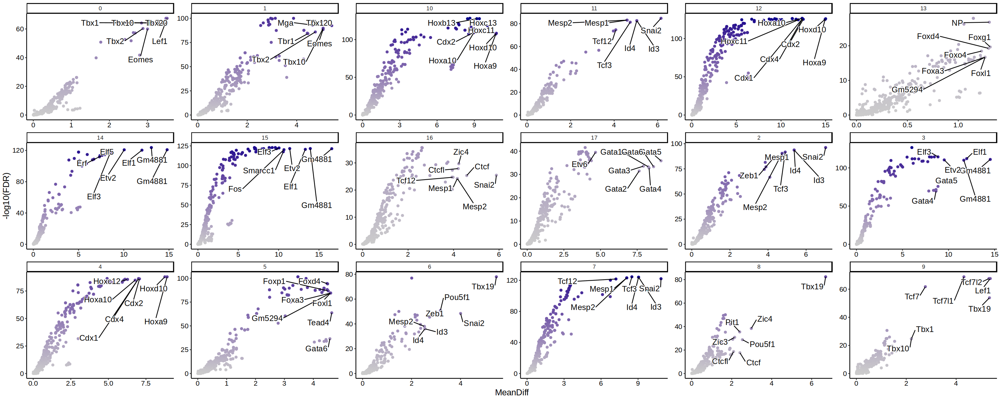

In [376]:
p = ggplot(diffMotif.dt[MeanDiff>0], aes(MeanDiff, -log10(FDR), label=motif)) +
            geom_point(aes(col = -log10(FDR))) +
            scale_color_gradient(low='gray80', high='darkblue', name = '-log10(FDR)') + 
            ggrepel::geom_text_repel(data=diffMotif.dt[MeanDiff>0] %>% 
                                            .[,head(.SD, 7), by=mofa_cluster],
                                aes(x=MeanDiff, y=-log10(FDR)), 
                                 max.overlaps=Inf, 
                                 box.padding = 0.8,
                                 bg.color='white', 
                                 bg.r = 0.1,
                                 size=5) +
    facet_wrap(~mofa_cluster, scales='free', ncol=6) + 
    theme_classic() +
    theme(
       axis.text = element_text(color='black'),
      # axis.title = element_text(size=rel(1.0), color='black'),
        strip.text = element_text(size=10),
      text=element_text(size=15),
      legend.position="none"
    ) 
options(repr.plot.width=25, repr.plot.height=10)
p

### Motif Enrichment

In [395]:
plot_enr_heatmap = function(enrichMotifs, ntop=25) {
    heatmapEM <- plotEnrichHeatmap(enrichMotifs, n = ntop, returnMatrix = TRUE)

    enriched.dt = melt(as.data.table(heatmapEM, keep.rownames=T) %>% setnames('rn', 'TF'), id.vars = c("TF")) %>%
        .[order(-value)] %>% .[,TF:=strsplit(TF, '_') %>% map_chr(1)]

    keep_tfs = enriched.dt %>% .[,variable:=factor(variable, levels=cluster_levels)] %>% .[order(variable)] %>% .[, head(.SD, ntop),  by=variable] %>% .$TF   
    enriched.dt = enriched.dt[TF %in% keep_tfs] %>% .[order( -value)] %>% 
        #.[,TF:=strsplit(TF, '_') %>% map_chr(1)] %>%
         .[,TF:=factor(TF, levels=unique(keep_tfs))] %>%
        .[,variable:=factor(variable, levels=cluster_levels)]
    
    p = ggplot(enriched.dt, aes(TF, variable, fill=value)) + 
    geom_tile(col='black') +
    scale_fill_gradient(low='white', high='darkblue', name='Norm. Enrichment -log10(P-adj) [0-max]') +
    theme_void() + theme(text=element_text(size=15), 
                         axis.text.x=element_text(angle=-90,hjust=0,vjust=0.5, size=15), 
                         axis.text.y=element_text(hjust=0),
                        legend.position='bottom')
p
    return(p)
}

In [392]:
markersPeaks <- getMarkerFeatures(
    ArchRProj = ArchRProject, 
    useMatrix = "PeakMatrix", 
    groupBy = "mofa_cluster",
    bias = c("TSSEnrichment", "log10(nFrags)"),
    testMethod = "wilcoxon"
)

ArchR logging to : ArchRLogs/ArchR-getMarkerFeatures-15154a1d84be03-Date-2023-05-25_Time-15-32-36.log
If there is an issue, please report to github with logFile!

MatrixClass = Sparse.Integer.Matrix

2023-05-25 15:32:37 : Matching Known Biases, 0.002 mins elapsed.

###########
2023-05-25 15:33:54 : Completed Pairwise Tests, 1.292 mins elapsed.
###########

ArchR logging successful to : ArchRLogs/ArchR-getMarkerFeatures-15154a1d84be03-Date-2023-05-25_Time-15-32-36.log



In [ ]:
# CISBP
enrichMotifs <- suppressMessages(peakAnnoEnrichment(
    seMarker = markersPeaks,
    ArchRProj = ArchRProject,
    peakAnnotation = "Motif_cisbp",
    cutOff = "FDR <= 0.1 & Log2FC >= 0.5"
  ))
colnames(enrichMotifs) = 0:17

ArchR logging to : ArchRLogs/ArchR-plotEnrichHeatmap-15154a532ab816-Date-2023-05-25_Time-15-59-02.log
If there is an issue, please report to github with logFile!



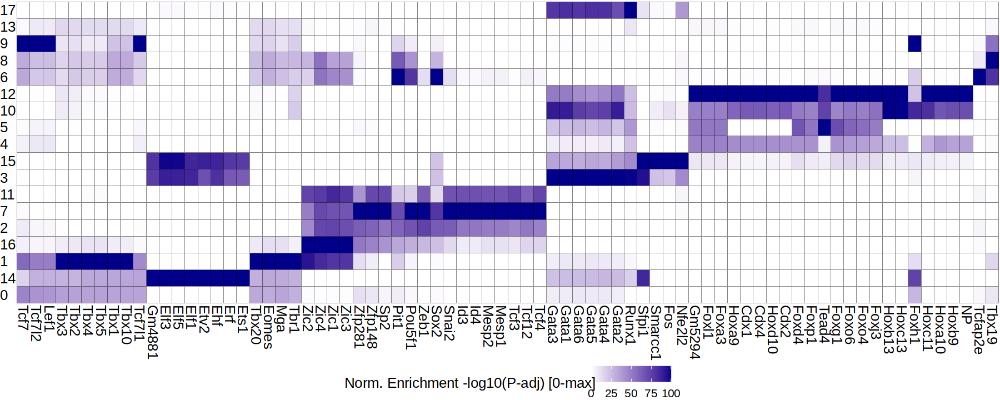

In [398]:
options(repr.plot.width=15, repr.plot.height=6)
plot_enr_heatmap(enrichMotifs, ntop = 10)

ArchR logging to : ArchRLogs/ArchR-plotEnrichHeatmap-15154a7b8b07df-Date-2023-05-25_Time-15-59-11.log
If there is an issue, please report to github with logFile!



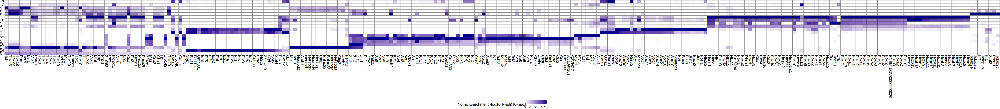

In [399]:
options(repr.plot.width=55, repr.plot.height=6)
plot_enr_heatmap(enrichMotifs, ntop = 50)

ArchR logging to : ArchRLogs/ArchR-plotEnrichHeatmap-15154a1c84bd9f-Date-2023-05-25_Time-16-00-30.log
If there is an issue, please report to github with logFile!

ArchR logging to : ArchRLogs/ArchR-plotEnrichHeatmap-15154a2ee93ddc-Date-2023-05-25_Time-16-00-30.log
If there is an issue, please report to github with logFile!



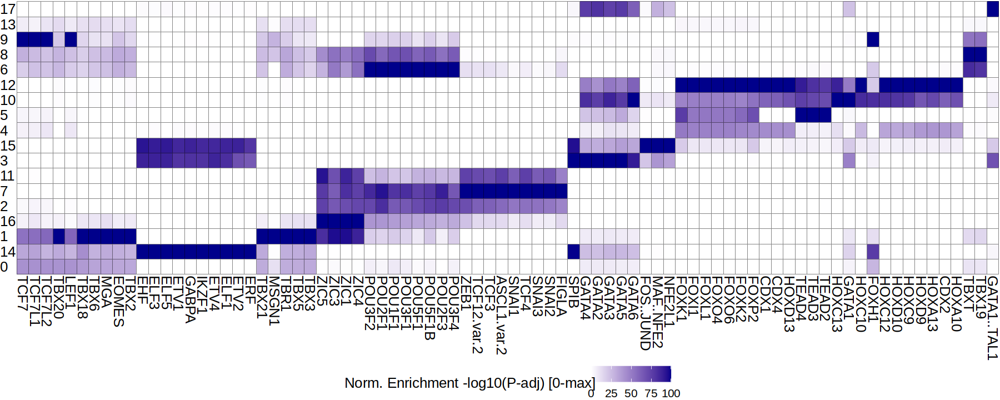

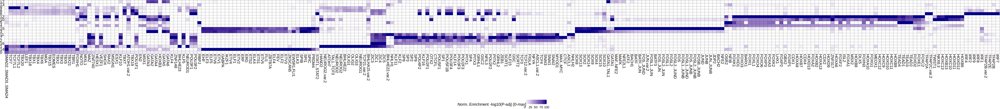

In [403]:
# JASPAR
enrichMotifs <- suppressMessages(peakAnnoEnrichment(
    seMarker = markersPeaks,
    ArchRProj = ArchRProject,
    peakAnnotation = "Motif_JASPAR2020",
    cutOff = "FDR <= 0.1 & Log2FC >= 0.5"
  ))
colnames(enrichMotifs) = 0:17

options(repr.plot.width=15, repr.plot.height=6)
plot_enr_heatmap(enrichMotifs, ntop = 10)

options(repr.plot.width=55, repr.plot.height=6)
plot_enr_heatmap(enrichMotifs, ntop = 50)

## Label Transfer

In [421]:
mapping = fread(args$mapping)[match(umap$cell, cell)]

In [422]:
summary(mapping$cell == umap$cell)

   Mode    TRUE 
logical   31596 

In [423]:
mapping = cbind(mapping, copy(umap)[,cell:=NULL])

In [424]:
colnames(mapping)

[1] "cell"                         "barcode"                     
 [3] "sample"                       "nFeature_RNA"                
 [5] "nCount_RNA"                   "mitochondrial_percent_RNA"   
 [7] "ribosomal_percent_RNA"        "alias"                       
 [9] "day"                          "genotype"                    
[11] "replicate"                    "pass_rnaQC"                  
[13] "doublet_score"                "doublet_call"                
[15] "celltype.mapped_mnn"          "celltype.score_mnn"          
[17] "celltype_extended.mapped_mnn" "celltype_extended.score_mnn" 
[19] "stage.mapped_mnn"             "cellstage.score_mnn"         
[21] "closest.cell_mnn"             "celltype_genotype"           
[23] "celltype_extended_genotype"   "UMAP1"                       
[25] "UMAP2"

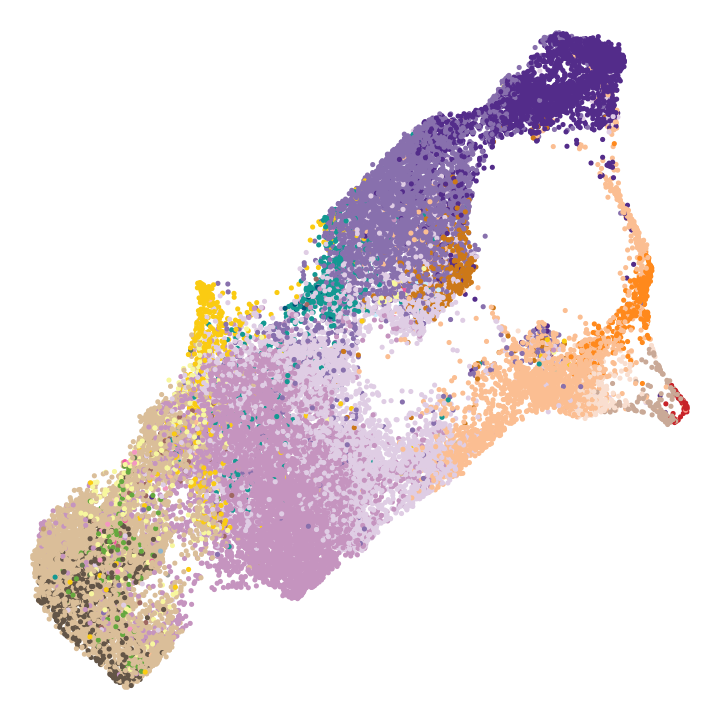

In [427]:
options(repr.plot.width=6, repr.plot.height=6)
p1 = ggplot(mapping, aes(UMAP1, UMAP2, col=celltype.mapped_mnn)) + 
    geom_point(size=0.4) + 
    scale_color_manual(values=opts$celltype.colors) + 
    theme_void() + 
    theme(legend.position = 'none')
p1

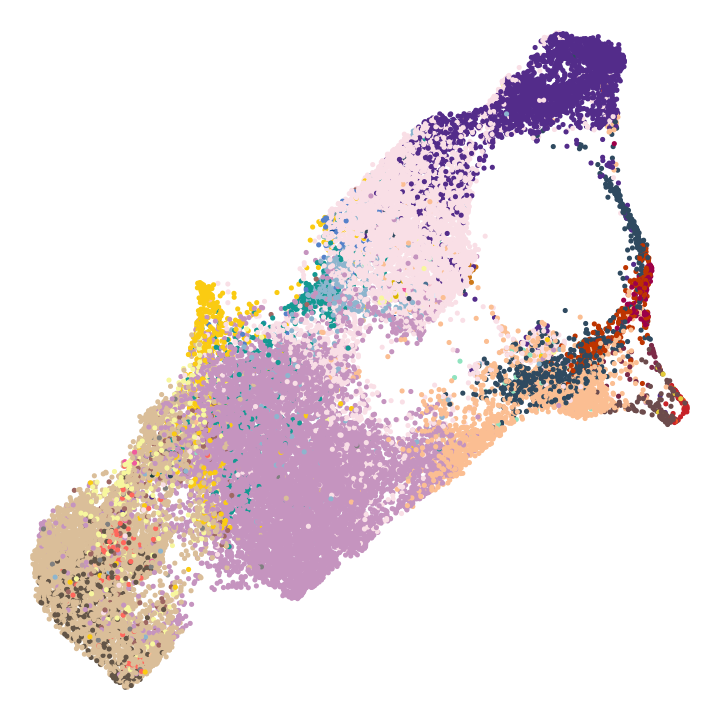

In [428]:
options(repr.plot.width=6, repr.plot.height=6)
p2 = ggplot(mapping, aes(UMAP1, UMAP2, col=celltype_extended.mapped_mnn)) + 
    geom_point(size=0.4) + 
    scale_color_manual(values=opts$celltype_extended.colors) + 
    theme_void() + 
    theme(legend.position = 'none')
p2

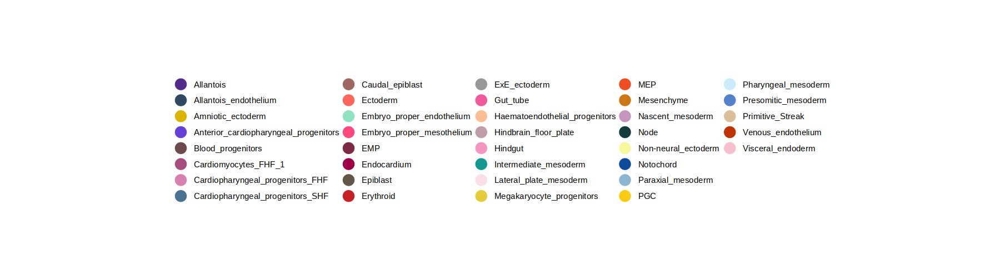

In [452]:
options(repr.plot.width=15, repr.plot.height=4)
legend = ggplot(mapping, aes(UMAP1, UMAP2, col=celltype_extended.mapped_mnn)) + 
    geom_point(size=5) + 
    scale_color_manual(values=opts$celltype_extended.colors, name='') + 
    guides(col=guide_legend(ncol=5)) + 
    theme_void() + 
    theme(legend.position = 'right')
leg = get_legend(legend)
as_ggplot(leg)

In [453]:
mapping$mofa_cluster = meta$mofa_cluster

In [457]:
# Plot mapped vs actual cell-types
proportions = copy(mapping) %>%
    .[,c('mofa_cluster', 'celltype.mapped_mnn')] %>% 
    .[, Ntot := .N, by = 'mofa_cluster'] %>% 
    .[, N := .N, by = c('mofa_cluster', 'celltype.mapped_mnn')] %>% 
    unique(by = c('mofa_cluster', 'celltype.mapped_mnn')) %>%
    .[, prop := N/Ntot]

combinations <- as.data.table(expand.grid(unique(proportions$mofa_cluster), unique(proportions$celltype.mapped_mnn))) %>%
    setnames(c('Var1', 'Var2'), c('mofa_cluster', 'celltype.mapped_mnn'))
proportions = merge(combinations, proportions, all.x=T) %>% 
    .[, prop:=ifelse(is.na(prop), 0, prop)]

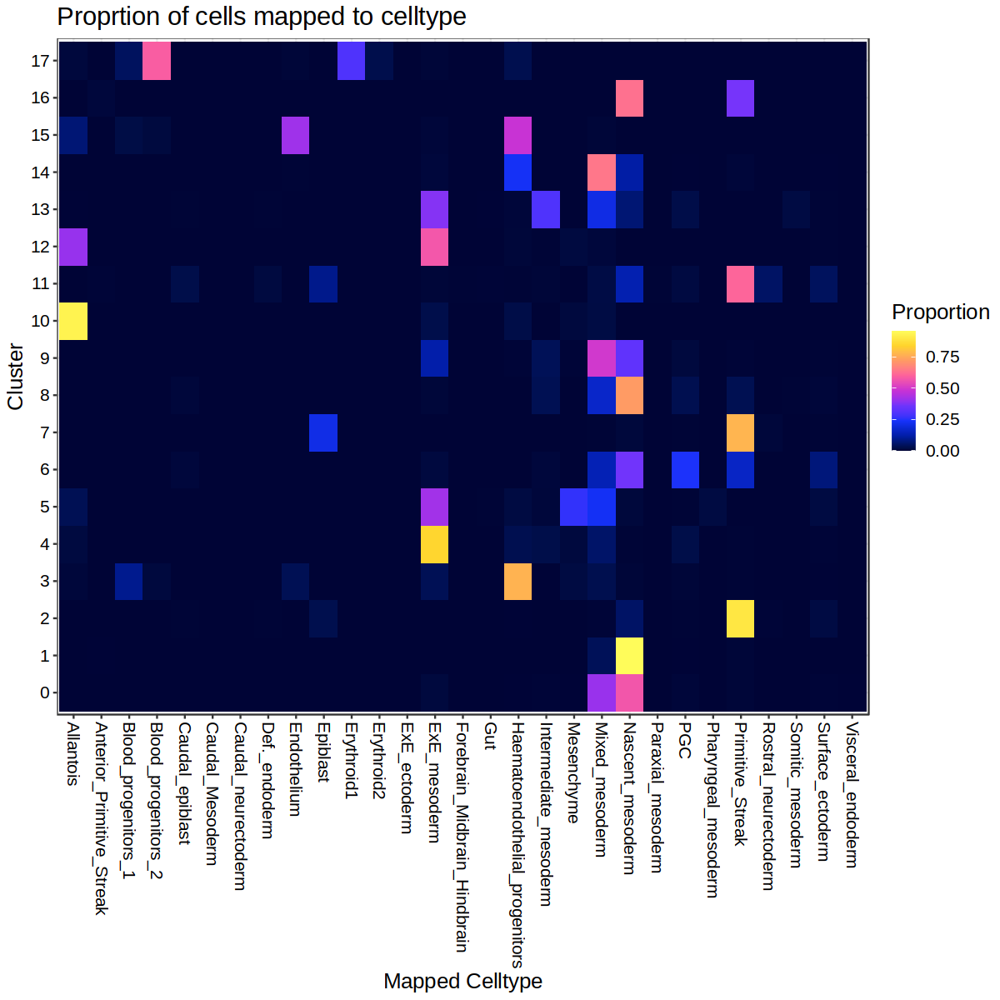

In [463]:
options(repr.plot.width=10, repr.plot.height=10)
ggplot(proportions[, mofa_cluster := factor(mofa_cluster, levels = 0:17)], aes(celltype.mapped_mnn, mofa_cluster, fill=prop)) +
    geom_tile() +
    scale_fill_gradientn(colours=ArchR::ArchRPalettes$horizonExtra, name='Proportion')+
    ggtitle('Proprtion of cells mapped to celltype') + 
    xlab('Mapped Celltype') + ylab('Cluster') + 
    theme_bw() + 
    theme(text=element_text(color='black', size=15),
          axis.text = element_text(color='black', size=12),
          axis.text.x = element_text(angle=-90, hjust=0, vjust=0.5))

Annotations based on incorporating all information: </br>
0 Early mesoderm, Eo dependent 2 </br>
1 Early mesoderm, Eo dependent 1 </br>
2 PS 2 </br>
3 HEP </br>
4 Posterior mesoderm </br>
5 Mesenchyme </br>
6 Early mesoderm, Eo independent 1 (maybe need to substract PGCs) </br>
7 PS 1 </br>
8 Early mesoderm, Eo independent 2 </br>
9 Early mesoderm, Eo independent 3 </br>
10 Allantois </br>
11 PS 4 </br>
12 Allantois progenitor </br>
13 Posterior mesoderm </br>
14 HEP progenitors </br>
15 Endothelium </br>
16 PS 3 </br>
17 Blood progenitor </br>

In [464]:
opts$clusters2celltypes = c(
    '0' = 'Early_Mes_EOd',
    '1' = 'Early_Mes_EOd',
    '2' = 'Primitive_Streak',
    '3' = 'HE',
    '4' = 'Posterior_Mes',
    '5' = 'Mesenchyme',
    '6' = 'Early_Mes_EOi',
    '7' = 'Primitive_Streak',
    '8' = 'Early_Mes_EOi',
    '9' = 'Early_Mes_EOi',
    '10' = 'Allantois',
    '11' = 'Primitive_Streak',
    '12' = 'Allantois_Precursor',
    '13' = 'Posterior_Mes',
    '14' = 'HE_Precursor',
    '15' = 'Endothelium',
    '16' = 'Primitive_Streak',
    '17' = 'Blood_Progenitor'    
)

In [478]:
meta_annotated = mapping
meta_annotated$celltype_v1 = opts$clusters2celltypes[match(as.character(test$mofa_cluster), names(opts$clusters2celltypes))]

opts$celltype_v1.colors = c(ArchR::ArchRPalettes$stallion, ArchR::ArchRPalettes$stallion2)[1:length(unique(opts$clusters2celltypes))]
names(opts$celltype_v1.colors) = unique(opts$clusters2celltypes)

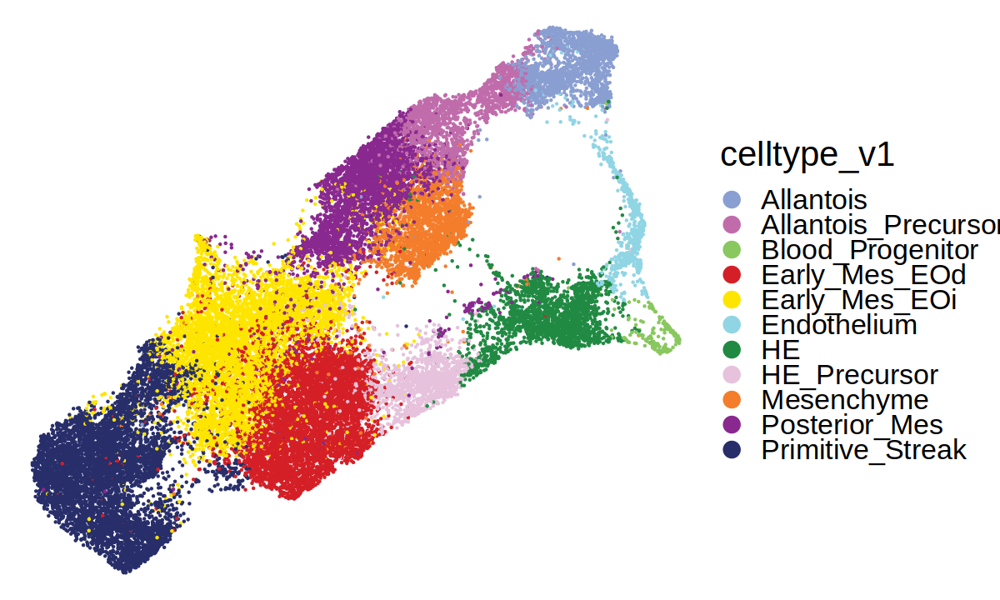

In [488]:
options(repr.plot.width=10, repr.plot.height=6)
p1 = ggplot(meta_annotated, aes(UMAP1, UMAP2, col=celltype_v1)) + 
    geom_point(size=0.2) + 
    scale_color_manual(values=opts$celltype_v1.colors) + 
    guides(col=guide_legend(ncol=1, override.aes = list(size=5))) + 
    theme_void() + 
    theme(legend.position = 'right',
         text = element_text(size=25))
p1

In [492]:
fwrite(meta_annotated, sprintf('%s/metadata_celltype_annotated.txt.gz', args$outdir))

In [4]:
# Need to annotate PGC since looking at gene expression does suggest these are proper PGC
meta_annotated = fread(sprintf('%s/metadata_celltype_annotated.txt.gz', args$outdir))

In [6]:
meta_annotated = meta_annotated[, celltype_v2 := ifelse(celltype.mapped_mnn == 'PGC', 'PGC', celltype_v1)]

In [39]:
fwrite(meta_annotated, sprintf('%s/metadata_celltype_annotated_v2.txt.gz', args$outdir))

In [50]:
opts$celltype_v2.colors = c(
    'Primitive_Streak' = "#DABE99", 
    'Early_Mes_EOi' = "#DFCDE4", 
    'Early_Mes_EOd' = "#C594BF", 
    'PGC' = "#FACB12", 
    'Posterior_Mes' = "#F9DFE6", 
    'HE_Precursor' = "#917057", 
    'HE' = "#FBBE92", 
    'Mesenchyme' = "#cc7818", 
    'Allantois_Precursor' = "#8870ad", 
    'Blood_Progenitor' = "#f9decf", 
    'Endothelium' = "#ff891c", 
    'Allantois' = "#532C8A"
)

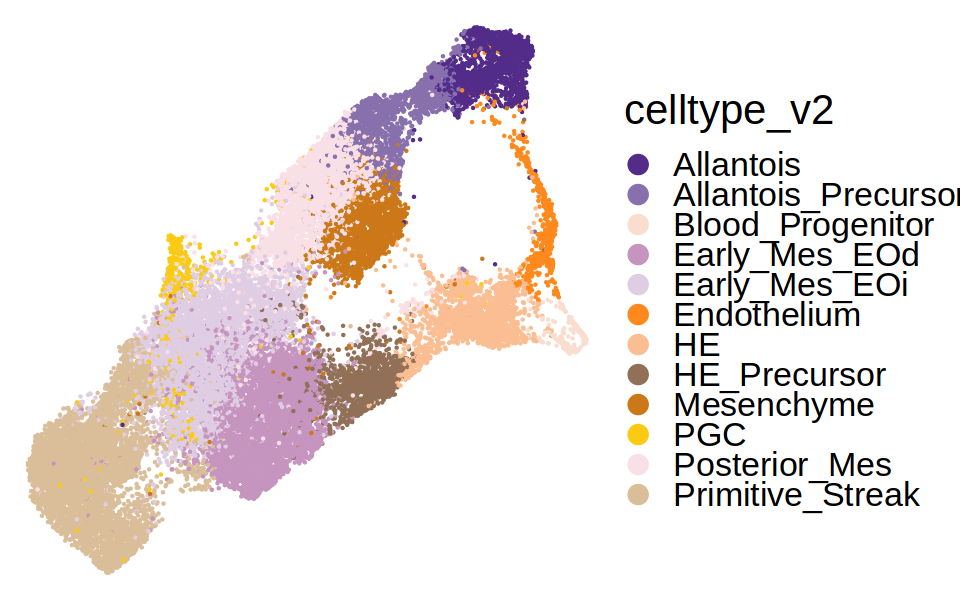

In [51]:
options(repr.plot.width=8, repr.plot.height=5)
p1 = ggplot(meta_annotated, aes(UMAP1, UMAP2, col=celltype_v2)) + 
    geom_point(size=0.2) + 
    scale_color_manual(values=opts$celltype_v2.colors) + 
    guides(col=guide_legend(ncol=1, override.aes = list(size=5))) + 
    theme_void() + 
    theme(legend.position = 'right',
         text = element_text(size=25))
p1

In [49]:
opts$celltype.colors

Epiblast               Primitive_Streak 
                     "#635547"                      "#DABE99" 
               Caudal_epiblast                            PGC 
                     "#9e6762"                      "#FACB12" 
     Anterior_Primitive_Streak                      Notochord 
                     "#c19f70"                      "#0F4A9C" 
                 Def._endoderm                            Gut 
                     "#F397C0"                      "#EF5A9D" 
              Nascent_mesoderm                 Mixed_mesoderm 
                     "#C594BF"                      "#DFCDE4" 
         Intermediate_mesoderm                Caudal_Mesoderm 
                     "#139992"                      "#3F84AA" 
             Paraxial_mesoderm               Somitic_mesoderm 
                     "#8DB5CE"                      "#005579" 
           Pharyngeal_mesoderm                 Cardiomyocytes 
                     "#C9EBFB"                      "#B51D8D" 
                     Allantois                   ExE_mesoderm 
                     "#532C8A"                      "#8870ad" 
                    Mesenchyme Haematoendothelial_progenitors 
                     "#cc7818"                      "#FBBE92" 
                   Endothelium              Blood_progenitors 
                     "#ff891c"                      "#c9a997" 
           Blood_progenitors_1            Blood_progenitors_2 
                     "#f9decf"                      "#c9a997" 
                     Erythroid                     Erythroid1 
                     "#EF4E22"                      "#C72228" 
                    Erythroid2                     Erythroid3 
                     "#f79083"                      "#EF4E22" 
                           NMP                   Neurectoderm 
                     "#8EC792"                      "#65A83E" 
          Rostral_neurectoderm            Caudal_neurectoderm 
                     "#65A83E"                      "#354E23" 
                  Neural_crest   Forebrain_Midbrain_Hindbrain 
                     "#C3C388"                      "#647a4f" 
                   Spinal_cord               Surface_ectoderm 
                     "#CDE088"                      "#f7f79e" 
             Visceral_endoderm                   ExE_endoderm 
                     "#F6BFCB"                      "#7F6874" 
                  ExE_ectoderm              Parietal_endoderm 
                     "#989898"                      "#1A1A1A"